In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
#!unzip "drive/MyDrive/Deep learning/test.zip" -d "drive/MyDrive/Deep learning/test/"

In [ ]:
# !unzip "drive/MyDrive/Deep learning/train.zip" -d "drive/MyDrive/Deep learning/train/"

In [ ]:
# import os
# len(os.listdir("drive/MyDrive/Deep learning/train/"))

### get workspace ready

In [ ]:
# import tensorFlow into collab
import tensorflow as tf
import tensorflow_hub as hub
print("tensorflow version : ",tf.__version__)
print("tensi=or flow hub version : ",hub.__version__)

# check for gpu availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

tensorflow version :  2.15.0
tensi=or flow hub version :  0.16.1
GPU not available


In [ ]:
import os
len(os.listdir("drive/MyDrive/Deep learning/train/"))

10222

# getting the data ready (turning into tensors)
  

In [ ]:
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Deep learning/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


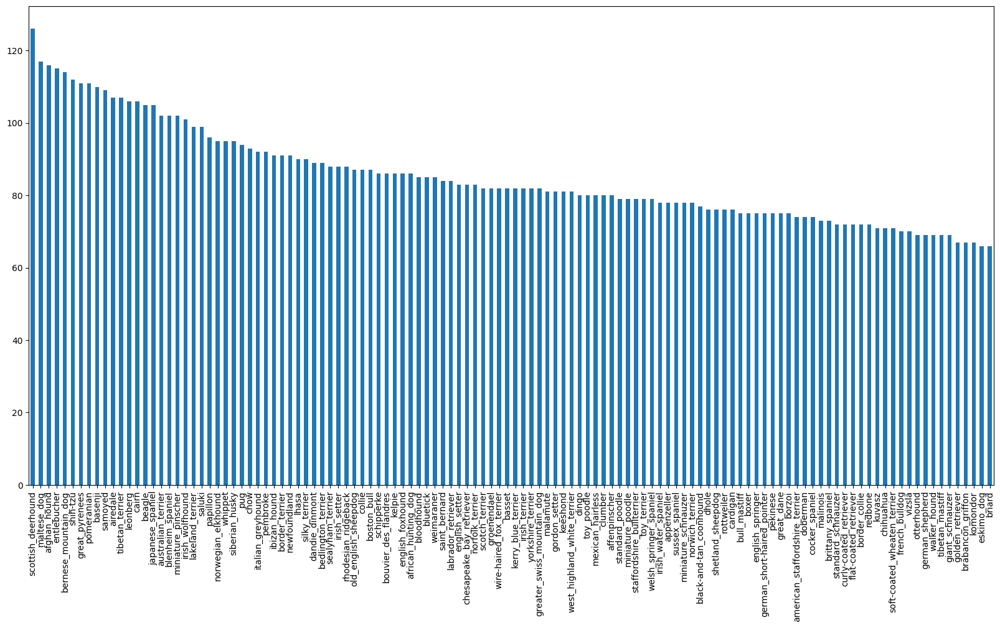

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


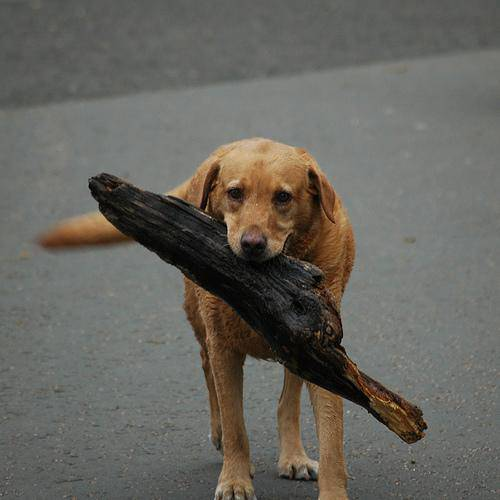

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Deep learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

### Getting images and their label
get the list of images of filenames

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Deep learning/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10 filenames
# filenames[:10]
len(filenames)

10222

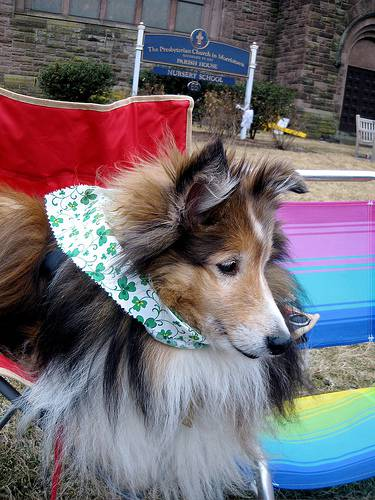

In [ ]:
Image(filenames[10])

In [ ]:
#check wether number of filenames match the actual number of images
import os
if len(os.listdir("drive/MyDrive/Deep learning/train/")) == len(filenames):
  print("OK")
else:
  print("NOT OK")

OK


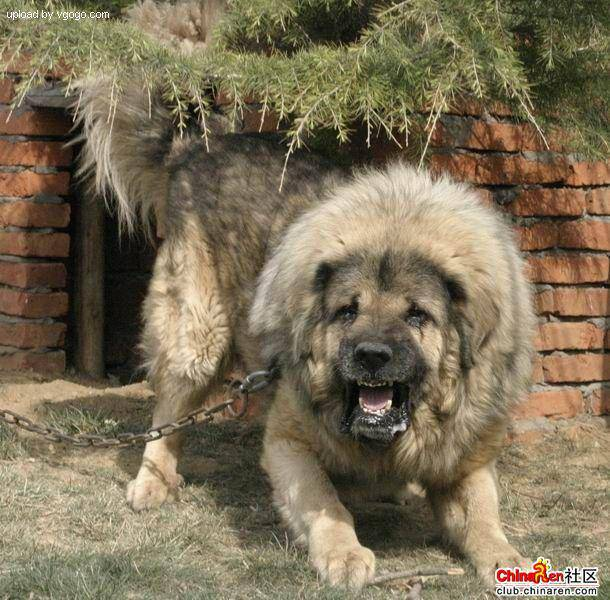

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

### we got training image filenames in a list, let's prepare our labels

In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels)==len(labels_csv["breed"]):
  print("OK")
else:
  print("not ok")

OK


In [ ]:
if len(labels) ==len(filenames):
  print("OK")
else:
  print("NOT OK")

OK


In [ ]:
unique_breed=np.unique(labels)
len(unique_breed)

120

In [ ]:
# turn every labels into boolean array

boolean_labels=[label==unique_breed for label in labels]
len(boolean_labels)

10222

In [ ]:
print(labels[0])
print(np.where(unique_breed==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(np.where(unique_breed==labels[2]))
print(boolean_labels[2].astype(int))

pekinese
(array([85]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[2].argmax()

85

### creating validation set

In [ ]:
# setup x and y variables
x=filenames
y=boolean_labels

### Starting off with 1000 images and increasing as needed

In [ ]:
# set number of images to use for experiment
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:5000}

In [ ]:
# split the data into training and validation set
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

### Converting images into tensor

In [ ]:
# converrt image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[1])
image.shape

(375, 500, 3)

In [ ]:
image.min(),image.max()

(0, 255)

In [ ]:
image[:2]

array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 51,  34,  26],
        [ 55,  38,  30],
        [ 61,  43,  33],
        ...,
        [127,  92,  62],
        [ 77,  42,  12],
        [167, 132, 102]],

       [[ 63,  44,  37],
        [ 64,  46,  36],
        [ 63,  45,  35],
        ...,
        [113,  82,  54],
        [ 44,  13,   0],
        [ 71,  40,  12]]], dtype=uint8)>

In [ ]:
# define image size
IMG_SIZE=224

# function for preprocessing images
def processing_images(image_path):
  #read in a image file
  image=tf.io.read_file(image_path)

  #turn the jpeg image into numerical tensor with color channel=3
  image=tf.image.decode_jpeg(image,channels=3)

  #convert the channel from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)

  #resize the image to a desired value of (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

### turning our data into batches

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = processing_images(image_path)
  return image, label

In [ ]:
#demo
(processing_images(x[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE=32
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  if test_data:
    print("creating test data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) #will give all of X into dataset
    data_batches=data.map(processing_images).batch(BATCH_SIZE)
    return data_batches
  elif valid_data:
    print("creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))#filepath and labels
    data_batches=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batches
  else:
    print("creting training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))#filepath and labels
    #shuffling pathname and labels before mapping is more efficient than shuffling images
    data=data.shuffle(buffer_size=len(X))
    #create image ,labels tuple (this also turns image into preprocessed image)
    data=data.map(get_image_label)

    #turn into batches
    data_batches=data.batch(BATCH_SIZE)

  return data_batches


In [ ]:
#creating training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

creting training data batches...
creating validation data batches...


In [ ]:
# different attributes of a databatches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
image[2]

array([[58, 38, 29],
       [58, 38, 27],
       [57, 37, 26],
       ...,
       [60, 33, 12],
       [53, 26,  5],
       [63, 36, 15]], dtype=uint8)

### Visualizing data batches

In [ ]:
import matplotlib.pyplot as plt

def show_images(images,labels):
  plt.figure(figsize=(10,10))

  for i in range(25):
    ax=plt.subplot(5,5,i+1)

    plt.imshow(images[i])
    plt.title(unique_breed[labels[i].argmax()])

In [ ]:
unique_breed[y[2].argmax()]

'pekinese'

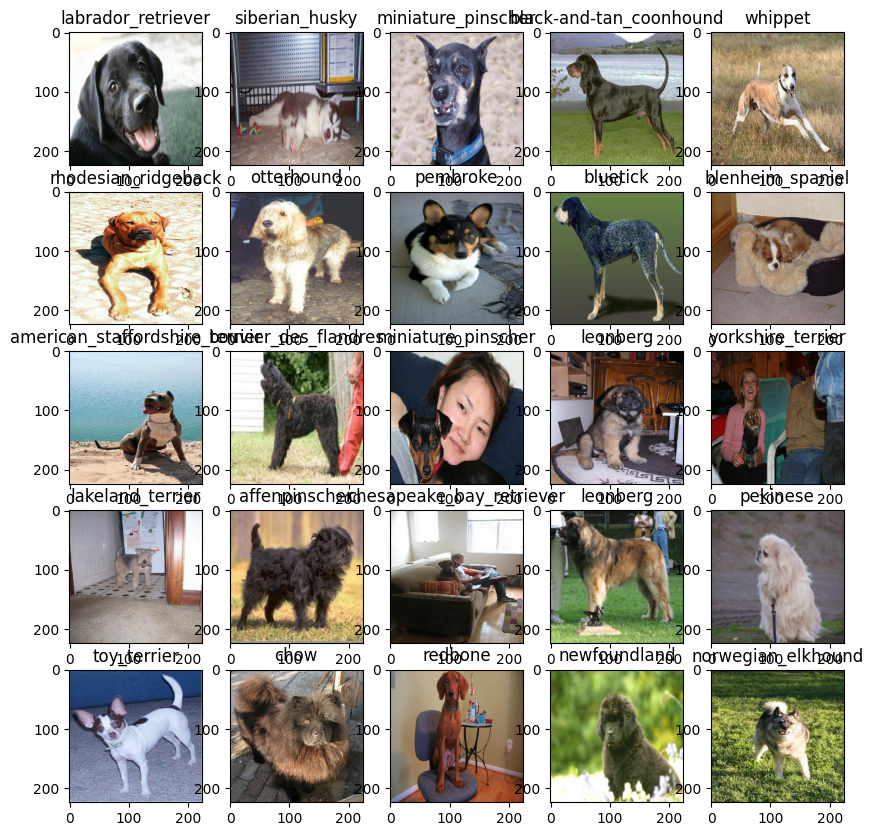

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_images(train_images, train_labels)

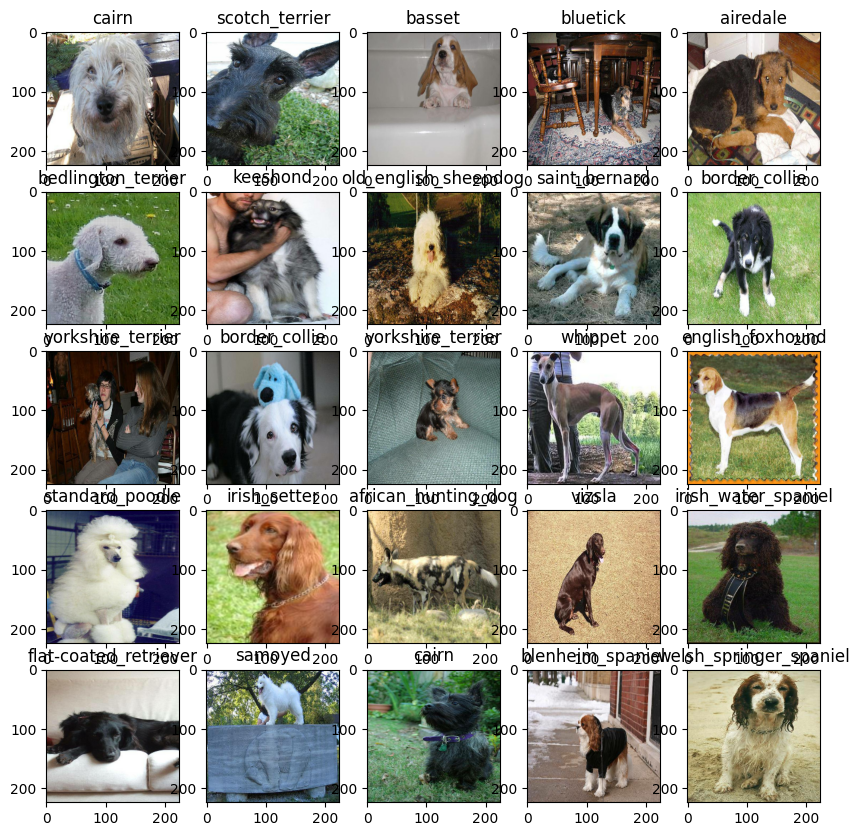

In [ ]:
#visualizing validation data batches
val_images,val_labels=next(val_data.as_numpy_iterator())
show_images(val_images,val_labels)

In [ ]:
#setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

#setup output shape to the model
OUTPUT_SHAPE=len(unique_breed)

MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
#create a function that builds Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  #setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(model_url),#layer 1(input layer)
      tf.keras.layers.Dense(units=output_shape,activation="softmax") #layer 2(output layer)
  ])

  #compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #build the model
  model.build(input_shape)
  return model

In [ ]:
model=create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### creating callbacks

In [ ]:
#tensorboard callback
%load_ext tensorboard

In [ ]:
import datetime

#create function to build a Tensorboard callback
def create_tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/Deep learning/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping Callback

early stopping helps to stop our model from overfitting by stopping training if a certain evaluation matrics stops improving.

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

### Training a model

first model will train on 1000 images to make sure everything is working

In [ ]:
NUM_EPOCHS=100#@param {type :"slider",min:10,max:100,step:10}

In [ ]:
print("ok" if tf.config.list_physical_devices("GPU")else "not available")

not available


In [ ]:
#build a function to train and return a trained model

def train_model():
  model=create_model()

  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,epochs=NUM_EPOCHS,
            validation_data=val_data,validation_freq=1,
            callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
model=train_model()

Epoch 1/100
25/25 [==============================] - 374s 12s/step - loss: 4.6544 - accuracy: 0.0900 - val_loss: 3.4251 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 54s 2s/step - loss: 1.6672 - accuracy: 0.6637 - val_loss: 2.1541 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 53s 2s/step - loss: 0.5836 - accuracy: 0.9300 - val_loss: 1.6800 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 63s 3s/step - loss: 0.2584 - accuracy: 0.9875 - val_loss: 1.5128 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 54s 2s/step - loss: 0.1494 - accuracy: 0.9962 - val_loss: 1.4142 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 63s 2s/step - loss: 0.1020 - accuracy: 0.9987 - val_loss: 1.3764 - val_accuracy: 0.6650
Epoch 7/100
25/25 [==============================] - 63s 3s/step - loss: 0.0760 - accuracy: 1.0000 - val_loss: 1.3464 - val_accuracy: 0.6700
Epoch 8/100

In [ ]:
# checking the tensorboard logs
%tensorboard --logdir drive/MyDrive/Deep\ learning/logs

<IPython.core.display.Javascript object>

#  making and evaluating the prediction using a trained model


In [ ]:
#make prediction on validation data
prediction=model.predict(val_data,verbose=1)
prediction

7/7 [==============================] - 22s 2s/step


array([[7.59501650e-04, 2.11000843e-05, 3.17746861e-04, ...,
        5.50510777e-05, 1.04284181e-05, 1.80227309e-03],
       [1.18460879e-03, 1.18252460e-03, 3.94177483e-03, ...,
        2.94965995e-03, 3.68142850e-03, 2.75049184e-04],
       [2.82238852e-06, 2.17094976e-06, 1.62381536e-06, ...,
        7.24154233e-07, 2.38734913e-07, 2.88180422e-06],
       ...,
       [8.57233226e-06, 1.94783825e-05, 3.91121102e-06, ...,
        9.56916210e-07, 4.19290096e-04, 3.96644173e-05],
       [2.26128451e-03, 1.41617260e-04, 1.28446671e-04, ...,
        2.16109576e-04, 5.60121771e-05, 1.47552071e-02],
       [7.72276180e-05, 7.75162334e-06, 1.10615016e-04, ...,
        4.41739947e-04, 2.10773069e-04, 4.46920349e-05]], dtype=float32)

In [ ]:
prediction.shape

(200, 120)

In [ ]:
np.sum(prediction[0])

0.9999999

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breed)

120

In [ ]:
#first prediction
index=90
print(prediction[index])
print(f"max value (probability of prediction): {np.max(prediction[index])}")
print(f"sum: {np.sum(prediction[index])}")
print(f"max index: {np.argmax(prediction[index])}")
print(f"predicted label: {unique_breed[np.argmax(prediction[index])]}")

[2.8105784e-05 3.2551521e-05 1.3996096e-05 5.4215602e-06 3.3430373e-05
 1.0231748e-05 1.9536128e-04 2.3064254e-04 4.0847156e-04 2.9661600e-03
 8.8305105e-06 1.5024249e-06 2.3953371e-05 2.0924515e-04 1.1830212e-04
 2.5606367e-03 1.5137033e-04 4.0837240e-05 2.1979422e-03 2.0445852e-05
 1.3010758e-05 6.9848393e-05 9.6436386e-05 2.2613202e-05 5.1062502e-04
 3.3830380e-05 1.8523291e-05 1.7346817e-04 5.4415370e-05 1.4819426e-05
 3.1561135e-06 9.2963301e-06 1.6451784e-05 1.8087136e-04 4.4570434e-06
 4.6260384e-06 1.0005182e-05 2.0829497e-05 2.0701960e-05 9.6498591e-01
 4.3900553e-05 1.0858089e-05 1.2716372e-05 3.8767746e-05 1.5553219e-04
 9.3681840e-05 2.4865213e-04 1.4365074e-04 2.4468368e-06 6.9564201e-05
 1.7049002e-05 2.3137793e-04 1.0414063e-04 6.8511254e-05 6.7691122e-05
 3.4960238e-03 6.5832617e-05 1.2747966e-05 3.3037795e-04 1.1047037e-05
 9.2625472e-05 2.1150089e-03 1.8368548e-06 5.9507179e-06 4.2553809e-05
 3.7747643e-05 4.9976319e-05 6.7017121e-05 5.4420245e-05 2.4862164e-05
 6.363

In [ ]:
unique_breed[39]

'english_foxhound'

In [ ]:
# turn prediction probabilities into  thier respective labels
def get_pred_label(prediction_probabilities):
  #turns an array of prediction probabilities into a label
  return unique_breed[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(prediction[0])
pred_label

'cairn'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
### since the data is in batches so it has to be unbatched
images=[]
labels=[]
for image,label in val_data.unbatch().as_numpy_iterator():
  images.append(image)
  labels.append(label)


images[0],labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels[0])

'cairn'

In [ ]:
get_pred_label(prediction[0])

'cairn'

In [ ]:
#function to unbach the images and label
def unbatchify(data):
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #get the pred label
  pred_label=get_pred_label(pred_prob)

  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)



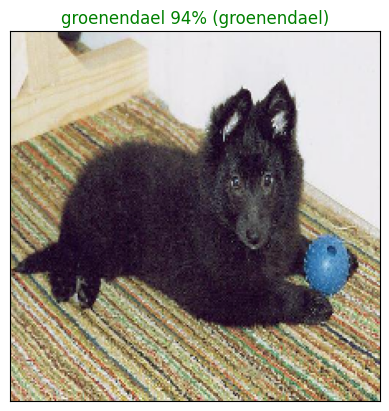

In [ ]:
plot_pred(prediction_probabilities=prediction,labels=val_labels,images=val_images,n=77)

In [ ]:
#visualize top 10 highest prediction confidences along with their truth label for sample n
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  #get the predicted label
  pred_label=get_pred_label(pred_prob)

  top_ten_pred_index=pred_prob.argsort()[-10:][::-1]

  top_10_pred_values=pred_prob[top_ten_pred_index]

  top_10_pred_labels=unique_breed[top_ten_pred_index]

  #plot the setup
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")


  #change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

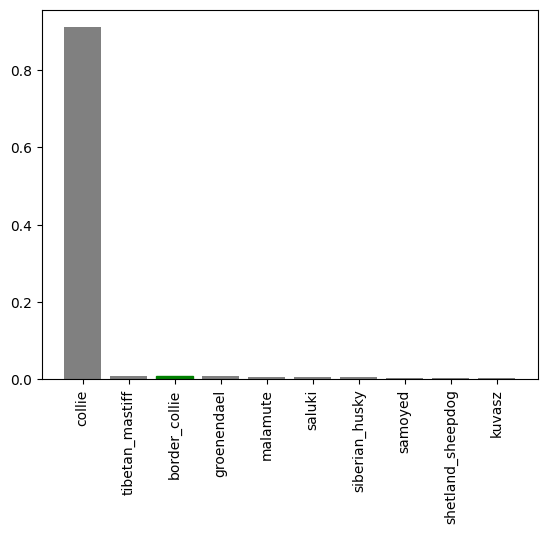

In [ ]:
plot_pred_conf(prediction_probabilities=prediction,labels=val_labels,n=9)

In [ ]:
# top 10 prediction of prediction[0]

prediction[0].argsort()[-10:][::-1]

#their values
prediction[0][prediction[0].argsort()[-10:][::-1]]




array([0.31841135, 0.22838427, 0.18279979, 0.05495074, 0.05095748,
       0.02807376, 0.0273878 , 0.01622089, 0.01334341, 0.00958182],
      dtype=float32)

In [ ]:
prediction[0].max()

0.31841135

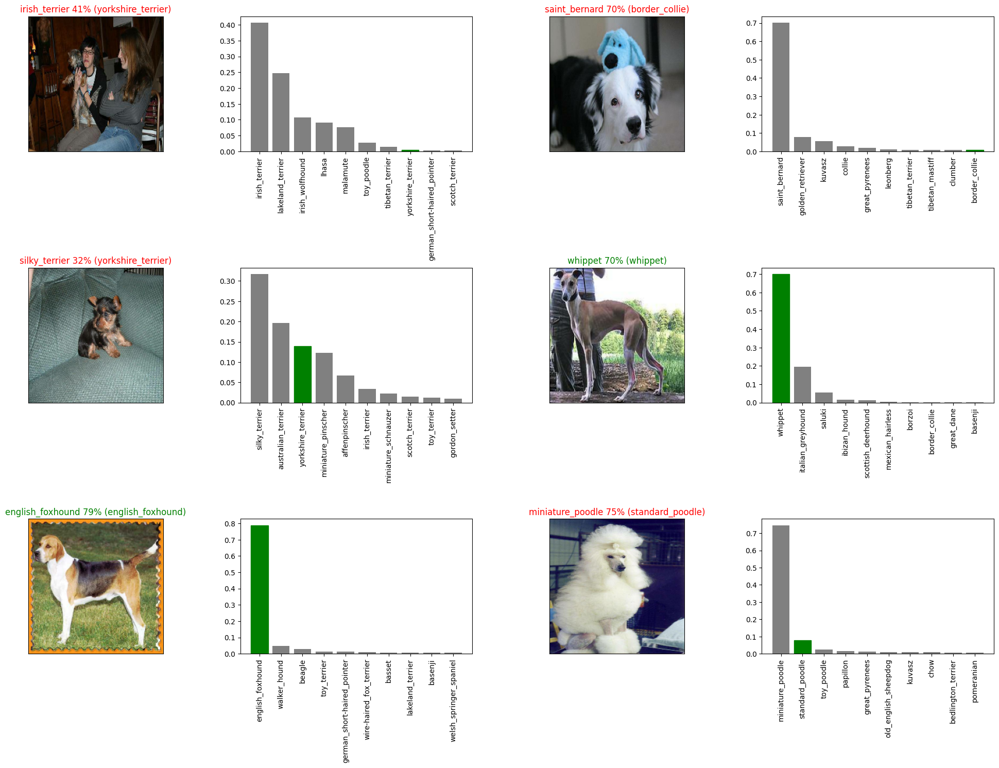

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=prediction,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=prediction,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading the traines model

In [ ]:
# create a function to save model
def save_model(model,suffix=None):
  model_dir=os.path.join("drive/MyDrive/Deep learning/Models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path=model_dir+"-"+suffix+".h5"#save model format

  model.save(model_path)

  return model_path

In [ ]:
#create a function to load the saved model
def load_model(model_path):
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

  return model

In [ ]:
save_model(model,suffix="1000-images-mobilenetv2-Adam")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Deep learning/Models/20240313-13261710336400-1000-images-mobilenetv2-Adam.h5'

In [ ]:
load_model=load_model('drive/MyDrive/Deep learning/Models/20240312-20571710277023-1000-images-mobilenetv2-Adam.h5')

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 12s 1s/step - loss: 1.2436 - accuracy: 0.6850


[1.2435568571090698, 0.6850000023841858]

In [ ]:
load_model.evaluate(val_data)

7/7 [==============================] - 12s 2s/step - loss: 1.3623 - accuracy: 0.6600


[1.3622984886169434, 0.6600000262260437]

### Training the model on full data


In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# creating batches for the full data
full_data=create_data_batches(x,y)

creting training data batches...


In [ ]:
full_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a model for full model
full_model=create_model()

In [ ]:
# create full model callbacks
full_model_tensorboard=create_tensorboard_callback()

# no validation set when training on full data , so validation accuracy can't be monitered
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
# # #fit the model
full_model.fit(x=full_data,epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

'drive/MyDrive/Deep learning/Models/20240313-13271710336439-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
print(type(image))

<class 'numpy.ndarray'>


In [ ]:
loaded_model = load_model('drive/MyDrive/Deep learning/Models/20240313-11411710330097-full-image-set-mobilenetv2-Adam.h5')


### making  prediction on test dataset


In [ ]:
# load the test images filename
test_path="drive/MyDrive/Deep learning/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/Deep learning/test/e8e6e731b4afb84faf9c022a67935867.jpg',
 'drive/MyDrive/Deep learning/test/e823ee1ca007c88600806925a6f2bce1.jpg',
 'drive/MyDrive/Deep learning/test/e93dde9e36ff6a41cd0e72fb01703be6.jpg',
 'drive/MyDrive/Deep learning/test/e864985e40823a56d3ad8594066d0641.jpg',
 'drive/MyDrive/Deep learning/test/e90bd6aa38e304f67db74f757df9a834.jpg',
 'drive/MyDrive/Deep learning/test/e806fbb5ca4dd3a094f7819bd810cc65.jpg',
 'drive/MyDrive/Deep learning/test/e8e5d64a1789dd86009b07003bed090b.jpg',
 'drive/MyDrive/Deep learning/test/e89317cab9060dcaa19f1b669d363223.jpg',
 'drive/MyDrive/Deep learning/test/e8914f74848c23b70b520887b3ff2e8a.jpg',
 'drive/MyDrive/Deep learning/test/e89d149b27db1f144ca122bb29b8ab9f.jpg']

In [ ]:
#create test data batches
test_data=create_data_batches(test_filenames,test_data=True)

creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make prediction on test data using the fully loaded model
test_predictions=loaded_model.predict(test_data,verbose=1)

324/324 [==============================] - 947s 3s/step


In [124]:
test_predictions[0]

array([2.75331147e-12, 2.66522051e-14, 8.31624605e-14, 5.08404430e-11,
       1.82916498e-04, 1.69073366e-11, 1.14077411e-11, 2.24713269e-11,
       9.63974926e-14, 4.03678513e-09, 1.40486703e-13, 8.49882197e-15,
       2.77213772e-13, 1.26164884e-10, 1.26145872e-10, 3.93183090e-11,
       2.75417297e-12, 1.54044333e-08, 4.35167683e-14, 1.62962407e-10,
       1.05186540e-10, 9.99813795e-01, 4.96349128e-10, 6.53176853e-14,
       1.08406654e-12, 3.17838317e-06, 2.09001856e-13, 5.44979948e-14,
       3.15132707e-12, 1.38903754e-13, 2.74996970e-11, 4.48140206e-11,
       5.17343709e-13, 1.67186957e-13, 4.53622112e-13, 7.85985253e-12,
       1.50985030e-12, 2.62504567e-11, 9.66290936e-10, 7.95092464e-12,
       1.36755926e-14, 4.73455693e-12, 4.34865062e-13, 3.49967798e-15,
       2.41514488e-17, 5.33143352e-09, 1.56262937e-11, 3.04173201e-12,
       8.68976115e-13, 2.57871960e-15, 1.02483357e-13, 9.28146804e-09,
       1.71548865e-12, 5.61173885e-10, 3.09297232e-14, 7.14711068e-11,
      

In [ ]:
#save prediciton to csv file
np.savetxt("drive/MyDrive/Deep learning/preds-array.csv",test_predictions,delimiter=",")

###preparing test dataset prediction from kaggle


In [118]:
#creating pandas dataframe with empty column
preds_df=pd.DataFrame(columns=["id"] + list(unique_breed))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [119]:
test_path

'drive/MyDrive/Deep learning/test/'

In [121]:
#append the test images ID's with prediction dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [122]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8e6e731b4afb84faf9c022a67935867,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e823ee1ca007c88600806925a6f2bce1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e93dde9e36ff6a41cd0e72fb01703be6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e864985e40823a56d3ad8594066d0641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e90bd6aa38e304f67db74f757df9a834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
#add the prediction probabilities to each dog breed column
preds_df[list(unique_breed)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8e6e731b4afb84faf9c022a67935867,2.753311e-12,2.665221e-14,8.316246e-14,5.084044e-11,1.829165e-04,1.690734e-11,1.140774e-11,2.247133e-11,9.639749e-14,...,1.193380e-10,4.583437e-13,4.783046e-11,8.764688e-12,3.802319e-13,7.724025e-14,3.529135e-13,9.890030e-12,2.418182e-10,6.687252e-10
1,e823ee1ca007c88600806925a6f2bce1,8.616727e-09,1.446725e-05,8.366318e-09,3.159574e-04,3.010631e-09,3.142282e-08,1.433562e-06,7.216302e-06,3.160927e-09,...,6.445694e-06,7.500647e-06,1.619350e-06,1.494339e-08,2.165284e-10,1.000299e-05,4.710814e-07,7.168059e-07,2.090133e-01,2.008009e-06
2,e93dde9e36ff6a41cd0e72fb01703be6,3.025611e-12,1.450185e-12,1.367400e-11,4.019829e-12,9.132447e-13,1.063541e-09,1.147126e-11,4.719460e-06,1.309491e-11,...,9.502046e-12,2.360482e-09,4.112005e-11,4.782177e-12,8.419244e-12,7.855526e-11,3.372325e-10,1.946303e-13,5.659580e-11,1.146324e-12
3,e864985e40823a56d3ad8594066d0641,1.565583e-08,7.491018e-09,1.915771e-05,2.065357e-07,5.019022e-07,1.490155e-09,1.420685e-09,1.743078e-10,1.163696e-11,...,3.529624e-08,5.564710e-08,6.767984e-09,7.791075e-09,9.354745e-06,2.686221e-08,5.944925e-09,4.003834e-05,1.110083e-06,8.572705e-08
4,e90bd6aa38e304f67db74f757df9a834,3.703052e-12,1.095155e-11,6.564368e-11,1.965778e-10,9.577528e-08,4.169189e-13,4.070548e-11,1.759066e-10,1.614043e-11,...,6.136065e-11,8.646120e-13,4.364692e-07,2.475166e-10,1.331565e-05,8.224144e-15,1.016539e-13,1.268610e-08,3.420668e-13,3.518740e-13


In [126]:
#save prediction dataframe to csv
preds_df.to_csv("drive/MyDrive/Deep learning/dog_breed_prediction.csv",index=False)

### Make prediction on custom images


In [127]:
custom_path="drive/MyDrive/Deep learning/my-dog-photos/"
custom_image_path=[custom_path+fname for fname in os.listdir(custom_path)]

In [128]:
custom_image_path

['drive/MyDrive/Deep learning/my-dog-photos/Jack_Russell_Terrier_1.jpg']

In [130]:
#turn image into batches dataset
custom_data=create_data_batches(custom_image_path,test_data=True)
custom_data

creating test data batches....


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [131]:
#make prediction
custom_preds=full_model.predict(custom_data)


1/1 [==============================] - 1s 772ms/step


In [132]:
custom_preds

array([[2.39861198e-03, 5.38118649e-03, 1.84914796e-03, 1.67484907e-03,
        6.71137415e-04, 7.88944773e-03, 3.92756332e-03, 1.20594716e-02,
        2.91911117e-03, 1.54514925e-03, 5.69086056e-03, 7.63918161e-02,
        4.19172342e-04, 1.22782569e-02, 4.83600982e-03, 4.07491392e-03,
        1.03294544e-01, 4.94449632e-03, 8.34900362e-04, 5.73485449e-04,
        1.87526719e-04, 6.74435496e-03, 3.53446393e-03, 1.83522596e-03,
        9.43266880e-03, 1.00865596e-04, 2.07768995e-02, 7.01940106e-03,
        2.22801510e-02, 7.31663406e-02, 1.39315310e-03, 1.92591660e-02,
        1.86171115e-03, 9.31402668e-02, 1.13748573e-02, 1.14749375e-04,
        1.01960767e-02, 1.25546809e-02, 9.58207122e-04, 4.94662207e-03,
        3.20958346e-03, 4.61984426e-04, 2.59308014e-02, 9.91889974e-05,
        1.22510754e-02, 1.22933777e-03, 4.33578854e-03, 4.83399816e-03,
        2.88779312e-03, 7.74536573e-04, 3.27370781e-03, 1.83933997e-04,
        3.95667218e-02, 7.16885179e-03, 2.05270713e-04, 1.379115

In [134]:
#get labels for prediction
custom_preds_label=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_label

['border_collie']

In [135]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

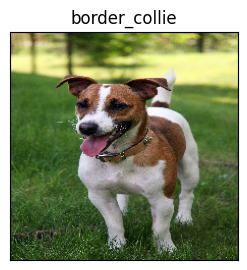

In [137]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_label[i])
  plt.imshow(image)